<a href="https://colab.research.google.com/github/ravellys/PID/blob/master/Lista8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Atividade \#8 - Filtros não Lineares
---
## Universidade Federal de Pernambuco - Departamento de Energia Nuclear
## Processamento de Imagens Digitais
### Aluno - Lucas Ravellys
---

In [ ]:
# Importando bibliotecas
import skimage as sk
import matplotlib.pyplot as plt
import imageio
import numpy as np
import os
from matplotlib import image
import cv2

In [ ]:
from google.colab import drive 
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%%capture
!pip install numba

# Adaptive Median Filter

from numba import njit,prange
import numpy as np

@njit
def padding(img, pad):
    padded_img = np.zeros((img.shape[0]+2*pad,img.shape[1]+2*pad))
    padded_img[pad:-pad,pad:-pad] = img
    return padded_img

@njit(parallel=True)
def AdaptiveMedianFilter(img,s=3,sMax=7):
    if len(img.shape) == 3:
        raise Exception ("Single channel image only")

    H,W = img.shape
    a = sMax//2
    padded_img = padding(img,a)

    f_img = np.zeros(padded_img.shape)

    for i in prange(a,H+a+1):
        for j in prange(a,W+a+1):
            value = Lvl_A(padded_img,i,j,s,sMax)
            f_img[i,j] = value

    return f_img[a:-a,a:-a] 

@njit
def Lvl_A(mat,x,y,s,sMax):
    window = mat[x-(s//2):x+(s//2)+1,y-(s//2):y+(s//2)+1]
    Zmin = np.min(window)
    Zmed = np.median(window)
    Zmax = np.max(window)

    A1 = Zmed - Zmin
    A2 = Zmed - Zmax

    if A1 > 0 and A2 < 0:
        return Lvl_B(window, Zmin, Zmed, Zmax)
    else:
        s += 2 
        if s <= sMax:
            return Lvl_A(mat,x,y,s,sMax)
        else:
             return Zmed

@njit
def Lvl_B(window, Zmin, Zmed, Zmax):
    h,w = window.shape

    Zxy = window[h//2,w//2]
    B1 = Zxy - Zmin
    B2 = Zxy - Zmax

    if B1 > 0 and B2 < 0 :
        return Zxy
    else:
        return Zmed

In [ ]:
from skimage import exposure

# Plotagem Imagem + Histograma
def plot_im_hist(im, bits = 8):
  fig, axes = plt.subplots(ncols=2, figsize=(12, 5))
  ax = axes.ravel()
  ax_cdf = ax[1].twinx()

  ax[0].imshow(im, cmap='gray', vmin =  0, vmax = 2**bits-1)
  ax[0].set_title('Image')
  ax[0].axis('off')

  ax[1].hist(im.ravel(), bins=(im.max()-im.min()), range = (0,  2**bits-1), density = True)
  ax[1].set_title('Histogram')

  img_cdf, bins = exposure.cumulative_distribution(im, nbins = 2**bits )
  ax_cdf.plot(bins, img_cdf, 'r')
  ax_cdf.set_yticks([])

  ax[1].grid(True)
  plt.show()

# Plota várias imagens
def plot_comp_image(ncols, titles, images, figsize = (12,24)): 
  n_images = len(images)

  fig, ax = plt.subplots(ncols = ncols, nrows = round(n_images/ncols), figsize = (30,120))
  ax = ax.ravel()

  for ax_,img, title in zip(ax,images,titles): 
    ax_.imshow(img,"gray", vmin =  0, vmax = 255)
    ax_.set_title(title)
    ax_.axis('off')

# Plota imagem e secção horizontal
def im_sec_plot(img,pos = 100):
  leny,lenx = img.shape
  line = img[pos,:]

  x = np.linspace(0,len(line),len(line))
  fig,ax = plt.subplots(ncols=2, figsize = (15,7))
  ax = ax.ravel()

  ax[0].plot(x,line)
  ax[0].grid()

  ax[1].imshow(img,"gray", vmin =  0, vmax = 255)
  ax[1].hlines(pos, 0, lenx,color = 'red')
  ax[1].set_xlim(0, lenx)

  plt.show()    

#altera range dos tons de cinza
def im_alt_range(im, n_min, n_max ):
  min = im.min()
  max = im.max()
  im_ = n_min +(im - min)*(n_max - n_min)/(max - min)
  return im_.astype(int)   

## 1) Use todos os filtros 2D relacionados com ruído que estiverem habilitados para melhorar a imagem Circuito.jpg. Faça um estudo comparativo dos resultados, indicando o melhor (ou melhores) para o tipo de problema na imagem.


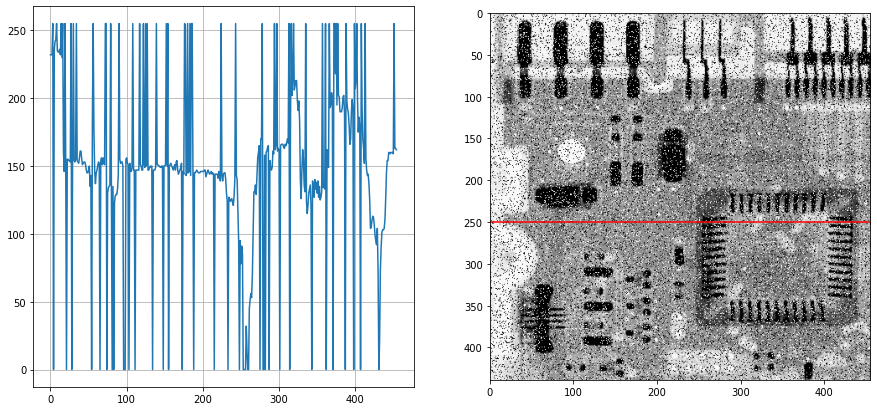

In [ ]:
#importando imagem
from skimage import io
file_ = "/content/drive/My Drive/Classroom/Processamento de Imagens Digitais/Lista 8 - PID/Lista 8/images/Circuito.jpg"
im_ruido = (io.imread(file_,as_gray=True)*255).astype(dtype=np.uint8)
im_sec_plot(im_ruido,pos = 250)

In [ ]:
list_method = ['autolevel',
               'autolevel_percentile',
               'bottomhat',
               'equalize',
               'maximum',
               'mean',
               'geometric_mean',
               'mean_percentile',
               'mean_bilateral',
               'median',
               'minimum',
               'modal',
               'enhance_contrast',
               'enhance_contrast_percentile',
               'sum',
               'sum_bilateral',
               'sum_percentile',
               'tophat',
               'otsu',
               'percentile',
               'majority']

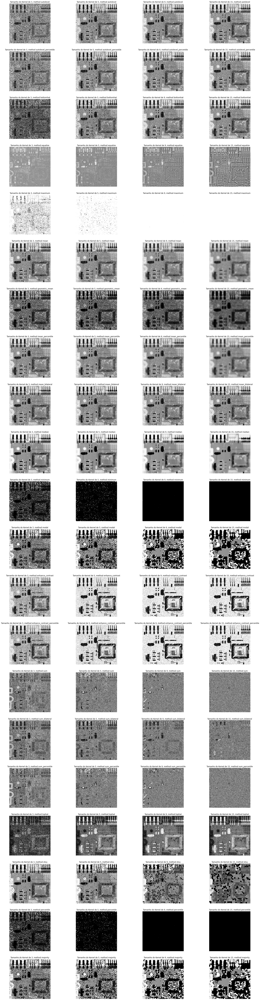

In [ ]:
from skimage.morphology import disk, square
from skimage.filters import rank

kernel = [3,5,9,15] # tamanhos das mascaras para convolução

imags = []
titles = []
for method in list_method:
  for i in kernel:
    method_to_call = getattr(rank, method)
    selem = square(i)
    im_normal = method_to_call(im_ruido, selem=selem)
    imags.append(im_normal)
    titles.append(f"Tamanho do Kernel de {i}, method {method}")
    #print(f"Tamanho do Kernel de {i}, method {method}")
    #plot_im_hist(im_normal)

plot_comp_image(4, titles, imags, (50,510))

É perceptível que o filtro não lineares de mediana com Kernel de 5 obtive o melhor resultado. 

## 2) Use os filtros não-lineares 2D de mediana e adaptável de mediana, com os mesmos dados de entrada na imagem CT_Sagital_SalEPimenta.jpg

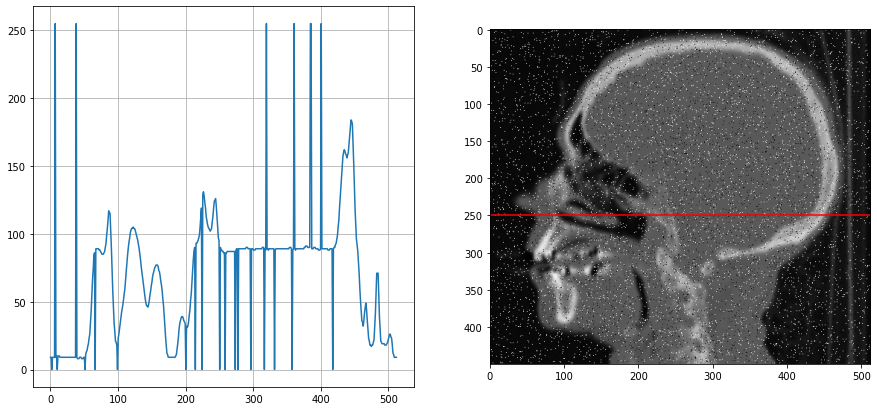

In [ ]:
#importando imagem
from skimage import io
file_ = "/content/drive/My Drive/Classroom/Processamento de Imagens Digitais/Lista 8 - PID/Lista 8/images/CT_Sagital_SalEPimenta.png"
im_ruido = (io.imread(file_,as_gray=True)*255).astype(dtype=np.uint8)
im_sec_plot(im_ruido,pos = 250)

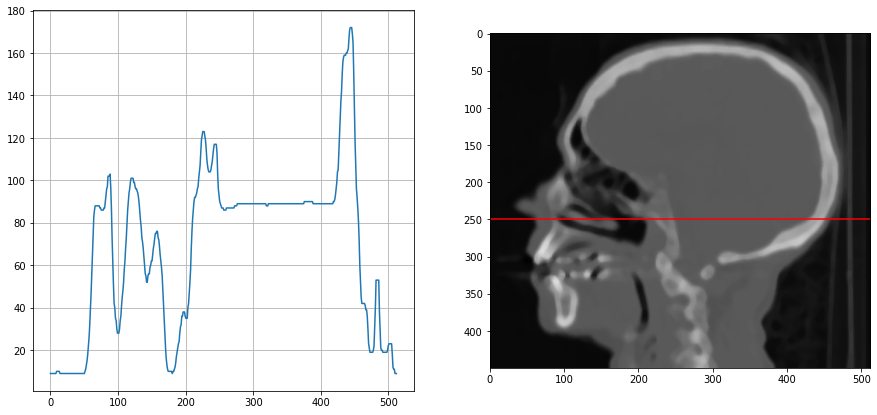

In [ ]:
from skimage.morphology import disk, square
from skimage.filters import rank

selem = square(9)
im_normal = rank.median(im_ruido, selem=selem)
im_sec_plot(im_normal,pos = 250)

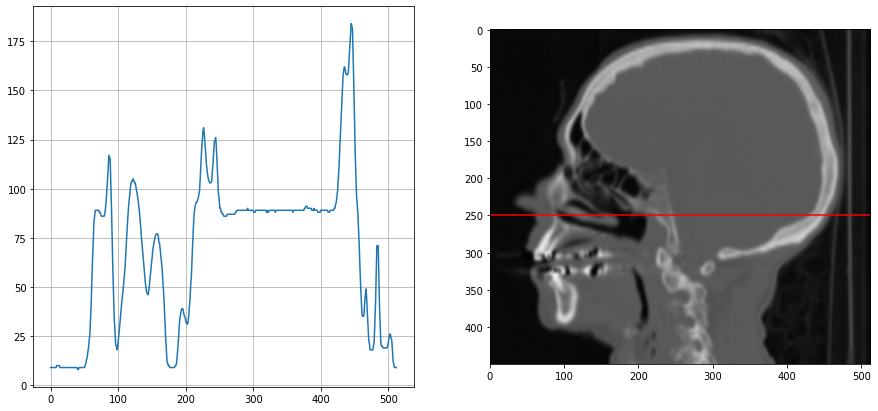

In [ ]:
im_normal = (AdaptiveMedianFilter(im_ruido,s=3,sMax=75)).astype(int)
im_sec_plot(im_normal,pos = 250)

Visualmente os dois filtros parecem retornar o mesmo resultado. Contudo, percebe-se na comparação de perfil de linha que o filtro de mediana adaptavel apresenta maiores pertubações nas áreas constantes.

## 3) Use o filtro 3D de medianas para reduzir os ruídos da pilha AmostraFemur.sgi, que contém amostras das trabéculas do fêmur de um adulto. Segmente a pilha filtrada usando um limiar apropriado e faça imagens 3D da pilha de entrada, a pilha sem os ruídos e a segmentada.

In [ ]:
# import file

dir =  '/content/drive/My Drive/Classroom/Processamento de Imagens Digitais/Lista 8 - PID/Lista 8/images/'
file_img = 'AmostraFemur.sgi'

f = open(os.path.join(dir,file_img),'rb') # Abrir arquivo para ler
img_arr=np.fromfile(f,dtype=np.uint8) # importar arquivo
print(img_arr.shape)
img_arr=img_arr[12:].reshape(-1,128,128) # reorganizar formato do arquivo
img_arr.shape # formato do arquivo

(2457612,)


(150, 128, 128)

In [ ]:
import scipy as sp

im_normal = img_arr.copy()
for i in range(1):
  im_normal = sp.ndimage.filters.median_filter(im_normal, size=3)

from skimage import exposure
im_equalize = (255*exposure.equalize_hist(im_normal)).astype(int)

In [ ]:
%%capture
!pip install porespy 
import porespy as ps 

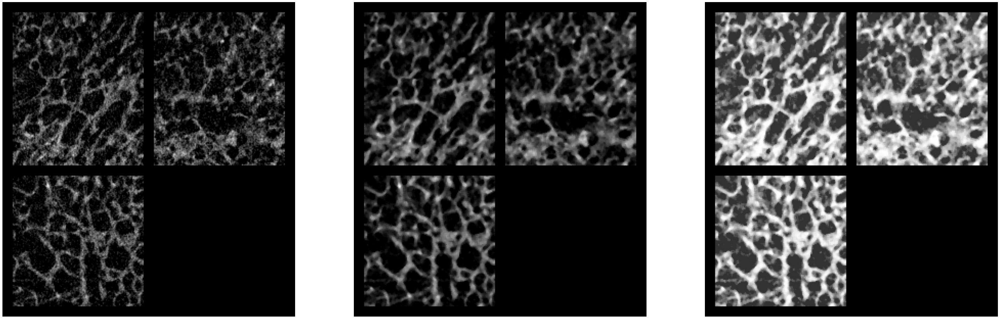

In [ ]:
fig, axes = plt.subplots(ncols = 3, figsize = (51,31))
ax = axes.ravel()

ax[0].imshow(ps.visualization.show_planes(img_arr), cmap = 'gray');
ax[0].axis('off')

ax[1].imshow(ps.visualization.show_planes(im_normal), cmap = 'gray');
ax[1].axis('off')

ax[2].imshow(ps.visualization.show_planes(im_equalize), cmap = 'gray');
ax[2].axis('off')

plt.show()

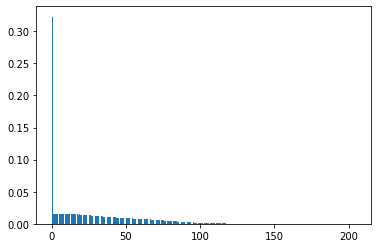

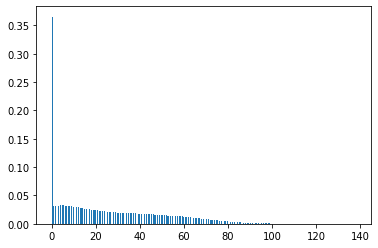

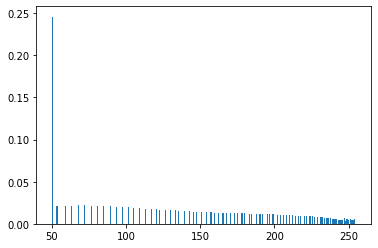

In [ ]:
plt.hist(img_arr.ravel(), bins = 255, density = True)
plt.show()

plt.hist(im_normal.ravel(), bins = 255, density = True)
plt.show()

plt.hist(im_equalize.ravel(), bins = 255, density = True)
plt.show()

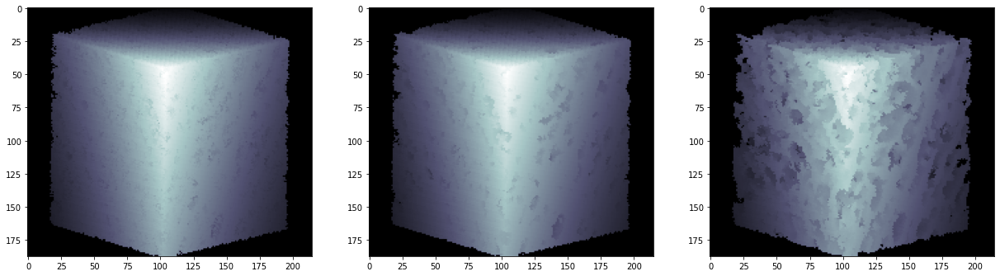

In [ ]:
fig, axes = plt.subplots(ncols = 3, figsize = (21,7))
ax = axes.ravel()
ax[0].imshow(ps.visualization.show_3D(255-img_arr), cmap = 'bone');
ax[1].imshow(ps.visualization.show_3D(255-im_normal), cmap = 'bone');
ax[2].imshow(ps.visualization.show_3D(im_equalize<=im_equalize.mean()), cmap = 'bone');